# Effect of Land Cover on Pollution in Chesapeake Watershed
## Hack the Bay 2020

### Project by: C Ellison, Megan Maloney, and Joe Barrow

Our product uses a model trained on the land cover of upstream area of stations to allow a user to predict pollution given land cover parameters of their choosing.

Data:
-NCLD: https://www.mrlc.gov/

-Water Quality (CBP stations): https://github.com/Hack-the-Bay/hack-the-bay

Background information from: https://www.chesapeakebay.net/what/programs/monitoring

Template for some of the code: https://github.com/moezilla-ml/DatabricksHackathon

This code looks at correlation between landcover types and polluation measures.

In [1]:
#load modules 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import urllib.request
import math
import geopandas 

import seaborn as sns
import datetime as dt
import scipy.stats as stats
from io import StringIO

#models
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor

## Read In Data

We use Water Quality data from CBP stations from the data provided. We also use land cover data as the inputs of study in the data exploration and modeling. Three levels of Hydrologic Unit Codes (HUCs) are used to find the propotion of land cover types in the vicinity of a station. We used ArcGIS to find the proportion of each land cover type in the HUCS upstream from a station.

In [2]:
#read in data

#measurements data (with HUCS)
file_location = 'WateQuality_wHUC_Percents.csv'
datadf = pd.read_csv(file_location)

#stream flow data
file_location = 'TrueLocationsStreamFlow.csv'
streamFlow = pd.read_csv(file_location)

#merge on locations
datadf = pd.merge(datadf, streamFlow, how = 'left', left_on = ['Latitude','Longitude'], right_on = ['Latitude','Longitude'])

datadf

,Unnamed: 0_x,Station,Latitude,Longitude,HUC12_,HUCNAME_,FIPS_,STATE_,COUNTY_,DateTime,...,PctVALUE_42,PctVALUE_43,PctVALUE_45,PctVALUE_46,PctVALUE_52,PctVALUE_71,PctVALUE_81,PctVALUE_82,PctVALUE_90,PctVALUE_95
0,0,1491000,38.99722,-75.78611,20600050203,Gravelly Branch-Choptank River,24011,MD,Caroline County,10/12/2011 9:00,...,0.004476,0.022401,0.000532,0.000260,0.001840,0.000145,0.005814,0.512727,0.313008,0.000820
1,1,1491000,38.99722,-75.78611,20600050203,Gravelly Branch-Choptank River,24011,MD,Caroline County,11/7/2011 11:00,...,0.004476,0.022401,0.000532,0.000260,0.001840,0.000145,0.005814,0.512727,0.313008,0.000820
2,2,1491000,38.99722,-75.78611,20600050203,Gravelly Branch-Choptank River,24011,MD,Caroline County,12/1/2011 10:30,...,0.004476,0.022401,0.000532,0.000260,0.001840,0.000145,0.005814,0.512727,0.313008,0.000820
3,3,1491000,38.99722,-75.78611,20600050203,Gravelly Branch-Choptank River,24011,MD,Caroline County,12/8/2011 11:30,...,0.004476,0.022401,0.000532,0.000260,0.001840,0.000145,0.005814,0.512727,0.313008,0.000820
4,4,1491000,38.99722,-75.78611,20600050203,Gravelly Branch-Choptank River,24011,MD,Caroline County,1/9/2012 10:30,...,0.004476,0.022401,0.000532,0.000260,0.001840,0.000145,0.005814,0.512727,0.313008,0.000820
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85785,85981,ZDM0002,38.93648,-76.50738,20600040302,Beards Creek-South River,24003,MD,Anne Arundel County,8/19/2008 8:15,...,0.000983,0.113543,0.000944,0.001084,0.006107,0.001231,0.026323,0.030626,0.049473,0.006292
85786,85982,ZDM0002,38.93648,-76.50738,20600040302,Beards Creek-South River,24003,MD,Anne Arundel County,9/3/2008 8:45,...,0.000983,0.113543,0.000944,0.001084,0.006107,0.001231,0.026323,0.030626,0.049473,0.006292
85787,85983,ZDM0002,38.93648,-76.50738,20600040302,Beards Creek-South River,24003,MD,Anne Arundel County,9/17/2008 10:45,...,0.000983,0.113543,0.000944,0.001084,0.006107,0.001231,0.026323,0.030626,0.049473,0.006292
85788,85984,ZDM0002,38.93648,-76.50738,20600040302,Beards Creek-South River,24003,MD,Anne Arundel County,10/1/2008 10:00,...,0.000983,0.113543,0.000944,0.001084,0.006107,0.001231,0.026323,0.030626,0.049473,0.006292


In [3]:
#remove null
#check for nulls
print(datadf.isnull().sum())

#remove 196 entries
datadf = datadf.dropna(subset=['PctVALUE_95'])
print(datadf.isnull().sum())

Unnamed: 0_x      0
Station           0
Latitude          0
Longitude         0
HUC12_            0
               ... 
PctVALUE_71     416
PctVALUE_81     416
PctVALUE_82     416
PctVALUE_90     416
PctVALUE_95     416
Length: 130, dtype: int64
Unnamed: 0_x    0
Station         0
Latitude        0
Longitude       0
HUC12_          0
               ..
PctVALUE_71     0
PctVALUE_81     0
PctVALUE_82     0
PctVALUE_90     0
PctVALUE_95     0
Length: 130, dtype: int64


In [4]:
datadf

,Unnamed: 0_x,Station,Latitude,Longitude,HUC12_,HUCNAME_,FIPS_,STATE_,COUNTY_,DateTime,...,PctVALUE_42,PctVALUE_43,PctVALUE_45,PctVALUE_46,PctVALUE_52,PctVALUE_71,PctVALUE_81,PctVALUE_82,PctVALUE_90,PctVALUE_95
0,0,1491000,38.99722,-75.78611,20600050203,Gravelly Branch-Choptank River,24011,MD,Caroline County,10/12/2011 9:00,...,0.004476,0.022401,0.000532,0.000260,0.001840,0.000145,0.005814,0.512727,0.313008,0.000820
1,1,1491000,38.99722,-75.78611,20600050203,Gravelly Branch-Choptank River,24011,MD,Caroline County,11/7/2011 11:00,...,0.004476,0.022401,0.000532,0.000260,0.001840,0.000145,0.005814,0.512727,0.313008,0.000820
2,2,1491000,38.99722,-75.78611,20600050203,Gravelly Branch-Choptank River,24011,MD,Caroline County,12/1/2011 10:30,...,0.004476,0.022401,0.000532,0.000260,0.001840,0.000145,0.005814,0.512727,0.313008,0.000820
3,3,1491000,38.99722,-75.78611,20600050203,Gravelly Branch-Choptank River,24011,MD,Caroline County,12/8/2011 11:30,...,0.004476,0.022401,0.000532,0.000260,0.001840,0.000145,0.005814,0.512727,0.313008,0.000820
4,4,1491000,38.99722,-75.78611,20600050203,Gravelly Branch-Choptank River,24011,MD,Caroline County,1/9/2012 10:30,...,0.004476,0.022401,0.000532,0.000260,0.001840,0.000145,0.005814,0.512727,0.313008,0.000820
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85785,85981,ZDM0002,38.93648,-76.50738,20600040302,Beards Creek-South River,24003,MD,Anne Arundel County,8/19/2008 8:15,...,0.000983,0.113543,0.000944,0.001084,0.006107,0.001231,0.026323,0.030626,0.049473,0.006292
85786,85982,ZDM0002,38.93648,-76.50738,20600040302,Beards Creek-South River,24003,MD,Anne Arundel County,9/3/2008 8:45,...,0.000983,0.113543,0.000944,0.001084,0.006107,0.001231,0.026323,0.030626,0.049473,0.006292
85787,85983,ZDM0002,38.93648,-76.50738,20600040302,Beards Creek-South River,24003,MD,Anne Arundel County,9/17/2008 10:45,...,0.000983,0.113543,0.000944,0.001084,0.006107,0.001231,0.026323,0.030626,0.049473,0.006292
85788,85984,ZDM0002,38.93648,-76.50738,20600040302,Beards Creek-South River,24003,MD,Anne Arundel County,10/1/2008 10:00,...,0.000983,0.113543,0.000944,0.001084,0.006107,0.001231,0.026323,0.030626,0.049473,0.006292


In [5]:
#look at column names
a  = datadf.columns
for i in range(0,len(a)):
    print(a[i])

Unnamed: 0_x
Station
Latitude
Longitude
HUC12_
HUCNAME_
FIPS_
STATE_
COUNTY_
DateTime
ACTIVE CHLOROPHYLL-A
DISSOLVED OXYGEN IN MG/L
AMMONIUM NITROGEN AS N (FILTERED SAMPLE)
NITRATE NITROGEN AS N (FILTERED SAMPLE)
PH CORRECTED FOR TEMPERATURE (25 DEG C)
ORTHOPHOSPHATE PHOSPHORUS AS P (FILTERED SAMPLE)
SALINITY UNITS IN PPT AND EQUAL TO PRACTICAL SALNITY UNITS (PSU)
SECCHI DEPTH
TOTAL ALKALINITY AS CACO3
TOTAL DISSOLVED SOLIDS; GRAVIMETRIC; DRIED AT 180 C
TOTAL KJELDAHL NITROGEN (WHOLE SAMPLE)
TOTAL NITROGEN
TOTAL PHOSPHORUS
TOTAL SUSPENDED SOLIDS
TURBIDITY; NEPHELOMETRIC METHOD
WATER TEMPERATURE DEG
HUC12
HUC10
HUC8
V_0_PERCENT
V_11_PERCENT
V_21_PERCENT
V_22_PERCENT
V_23_PERCENT
V_24_PERCENT
V_31_PERCENT
V_41_PERCENT
V_42_PERCENT
V_43_PERCENT
V_45_PERCENT
V_46_PERCENT
V_52_PERCENT
V_71_PERCENT
V_81_PERCENT
V_82_PERCENT
V_90_PERCENT
V_95_PERCENT
V_0_PERCENT_10
V_11_PERCENT_10
V_21_PERCENT_10
V_22_PERCENT_10
V_23_PERCENT_10
V_24_PERCENT_10
V_31_PERCENT_10
V_41_PERCENT_10
V_42_PERCENT_10
V

In [6]:
#names- HUC12, HUC10, HUC8, stream percents
HUC12_percent = ['V_11_PERCENT', 'V_21_PERCENT',
       'V_22_PERCENT', 'V_23_PERCENT', 'V_24_PERCENT', 'V_31_PERCENT',
       'V_41_PERCENT', 'V_42_PERCENT', 'V_43_PERCENT', 'V_45_PERCENT',
       'V_46_PERCENT', 'V_52_PERCENT', 'V_71_PERCENT', 'V_81_PERCENT',
       'V_82_PERCENT', 'V_90_PERCENT', 'V_95_PERCENT']


HUC10_percent = ['V_11_PERCENT_10', 'V_21_PERCENT_10', 'V_22_PERCENT_10',
       'V_23_PERCENT_10', 'V_24_PERCENT_10', 'V_31_PERCENT_10',
       'V_41_PERCENT_10', 'V_42_PERCENT_10', 'V_43_PERCENT_10',
       'V_45_PERCENT_10', 'V_46_PERCENT_10', 'V_52_PERCENT_10',
       'V_71_PERCENT_10', 'V_81_PERCENT_10', 'V_82_PERCENT_10',
       'V_90_PERCENT_10', 'V_95_PERCENT_10']

HUC8_percent = ['V_11_PERCENT_8','V_21_PERCENT_8', 'V_22_PERCENT_8', 'V_23_PERCENT_8', 'V_24_PERCENT_8',
       'V_31_PERCENT_8', 'V_41_PERCENT_8', 'V_42_PERCENT_8', 'V_43_PERCENT_8',
       'V_45_PERCENT_8', 'V_46_PERCENT_8', 'V_52_PERCENT_8', 'V_71_PERCENT_8',
       'V_81_PERCENT_8', 'V_82_PERCENT_8', 'V_90_PERCENT_8', 'V_95_PERCENT_8',]

stream_percent =['PctVALUE_11', 'PctVALUE_21', 'PctVALUE_22', 'PctVALUE_23',
       'PctVALUE_24', 'PctVALUE_31', 'PctVALUE_41', 'PctVALUE_42',
       'PctVALUE_43', 'PctVALUE_45', 'PctVALUE_46', 'PctVALUE_52',
       'PctVALUE_71', 'PctVALUE_81', 'PctVALUE_82', 'PctVALUE_90',
       'PctVALUE_95']

landcover_types = ['open water','developed, open space', 'developed low intensity',
                  'developed medium intensity', 'developed high intensity', 'barren land', 'deciduous forest',
                  'evergreen forest', 'mixed forest', 'shrub-Forest', 'herbaceous-Forest', 'shrub or scrub', 'grassland or herbaceous',
                   'pasture and hay', 'cultivated crops', 'woody wetland',
                  'emergent herbaceous wetland']

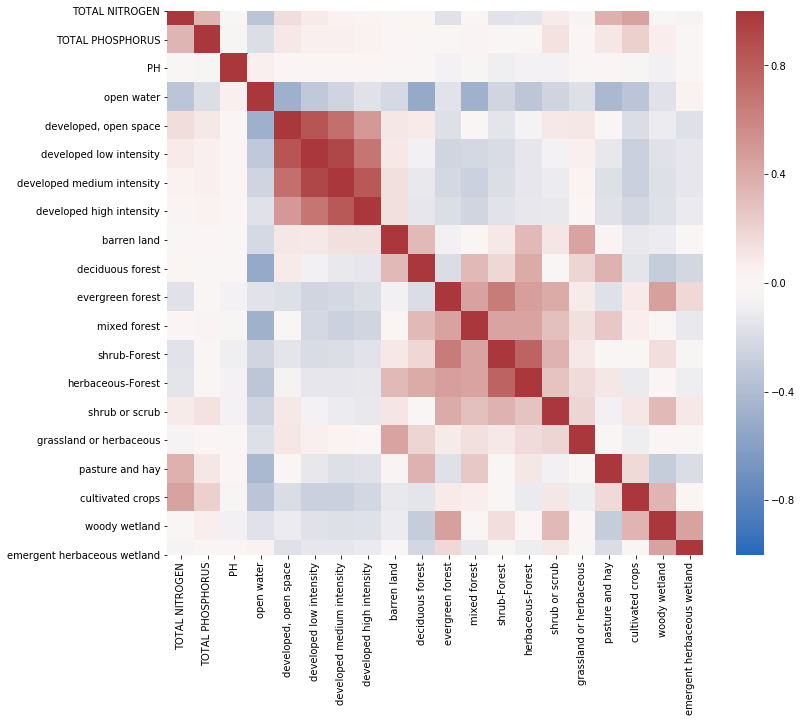

In [7]:
#correlation between Nitrogen and HUC12
outputs = ['TOTAL NITROGEN', 'TOTAL PHOSPHORUS','PH CORRECTED FOR TEMPERATURE (25 DEG C)' ]
curr_selection = outputs+HUC12_percent
curr = datadf[curr_selection]
corrHUCs = curr.corr(method ='pearson')
fig = plt.subplots(figsize=(12,10)) 
sns.heatmap(corrHUCs,cmap="vlag", vmin = -1, vmax = 1, xticklabels=['TOTAL NITROGEN', 'TOTAL PHOSPHORUS', 'PH']+landcover_types, yticklabels=['TOTAL NITROGEN', 'TOTAL PHOSPHORUS', 'PH']+landcover_types)

plt.savefig('correlationNitHUC12.jpg')

We see that the land cover types relating to development are correlated. Some of the forest types are also correlated. 

Developed open space, pature and hay, as well as cultivated crops are postively correlated with nitrogen levels. Open water and some of the forest types are negative correlated with nitrogen.

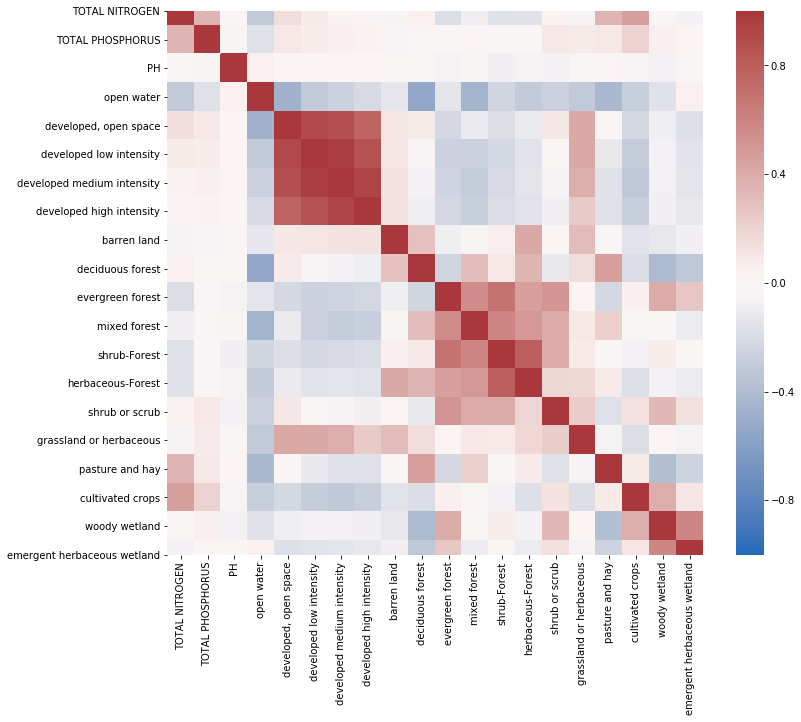

In [8]:
#HUC10 Correlation

outputs = ['TOTAL NITROGEN', 'TOTAL PHOSPHORUS','PH CORRECTED FOR TEMPERATURE (25 DEG C)' ]
curr_selection = outputs+HUC10_percent
curr = datadf[curr_selection]
corrHUCs = curr.corr(method ='pearson')
fig = plt.subplots(figsize=(12,10)) 
sns.heatmap(corrHUCs,cmap="vlag", vmin = -1, vmax = 1, xticklabels=['TOTAL NITROGEN', 'TOTAL PHOSPHORUS', 'PH']+landcover_types, yticklabels=['TOTAL NITROGEN', 'TOTAL PHOSPHORUS', 'PH']+landcover_types)

plt.savefig('correlationNitHUC10.jpg')

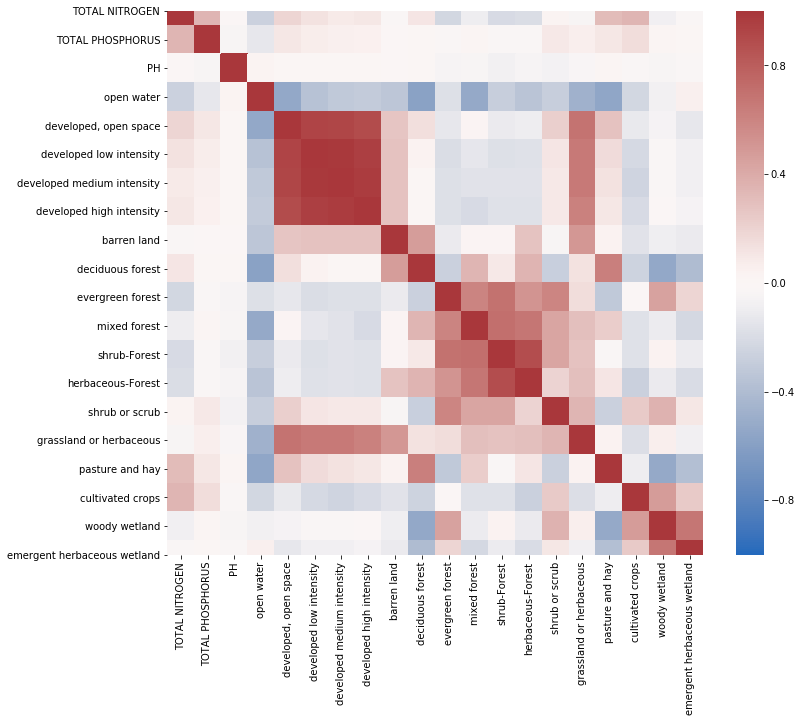

In [9]:
#HUC8 Correlation

outputs = ['TOTAL NITROGEN', 'TOTAL PHOSPHORUS','PH CORRECTED FOR TEMPERATURE (25 DEG C)' ]
curr_selection = outputs+HUC8_percent
curr = datadf[curr_selection]
corrHUCs = curr.corr(method ='pearson')
fig = plt.subplots(figsize=(12,10)) 
sns.heatmap(corrHUCs,cmap="vlag", vmin = -1, vmax = 1, xticklabels=['TOTAL NITROGEN', 'TOTAL PHOSPHORUS', 'PH']+landcover_types, yticklabels=['TOTAL NITROGEN', 'TOTAL PHOSPHORUS', 'PH']+landcover_types)

plt.savefig('correlationNitHUC8.jpg')

HUC8 is the largest HUC level we looked at. The development types are more highly correlated than in the smaller HUC levels, likely due to the larger area being covered within an individual unit.

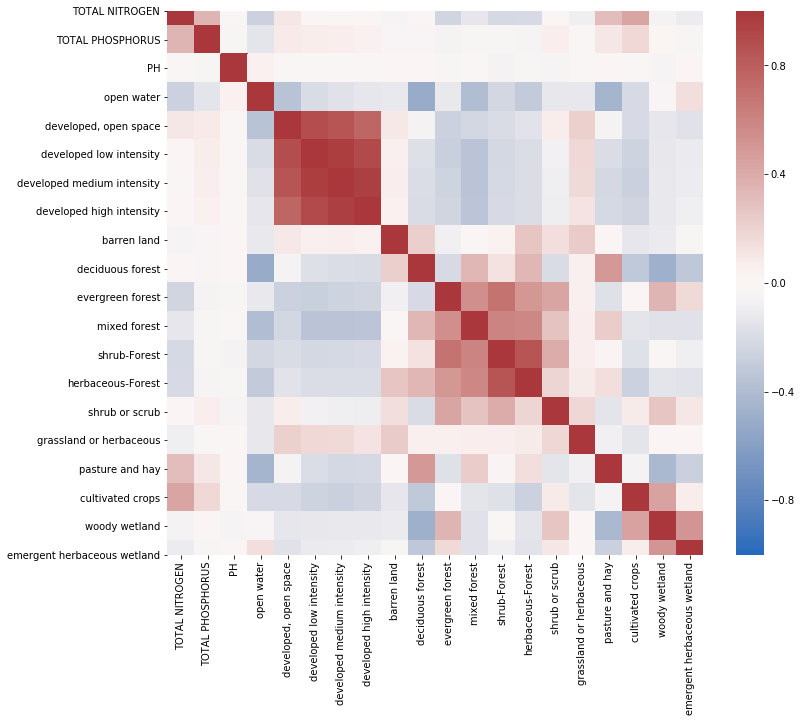

In [10]:
#correlation between pollution measures and Stream landcover

outputs = ['TOTAL NITROGEN', 'TOTAL PHOSPHORUS','PH CORRECTED FOR TEMPERATURE (25 DEG C)' ]
curr_selection = outputs+stream_percent
curr = datadf[curr_selection]
corrHUCs = curr.corr(method ='pearson')
fig = plt.subplots(figsize=(12,10)) 
sns.heatmap(corrHUCs,cmap="vlag", vmin = -1, vmax = 1, xticklabels=['TOTAL NITROGEN', 'TOTAL PHOSPHORUS', 'PH']+landcover_types, yticklabels=['TOTAL NITROGEN', 'TOTAL PHOSPHORUS', 'PH']+landcover_types)

plt.savefig('correlationNitHUCSream.jpg')

The upstream land cover type correlations are similar to the HUC land cover type correlations.

C:\Users\Charlotte\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
C:\Users\Charlotte\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


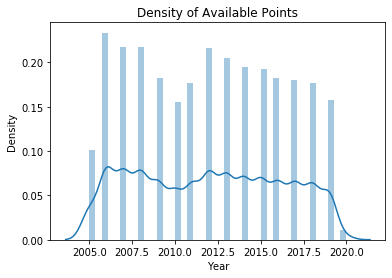

In [14]:
#get month and year
datadf['year'] = pd.DatetimeIndex(datadf['DateTime']).year
datadf['month'] = pd.DatetimeIndex(datadf['DateTime']).month

#display hitogram for year
ax = sns.distplot(datadf['year'])

ax.set(xlabel='Year', ylabel='Density', title = 'Density of Available Points')

plt.savefig('histYear.jpg')

There is more or less stable number of data points from 2005 to 2019

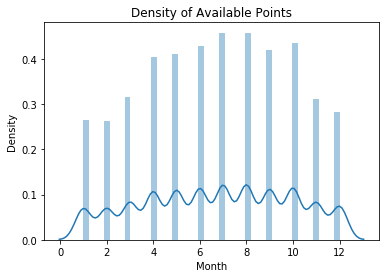

In [15]:
#display hitogram for year
ax = sns.distplot(datadf['month'])

ax.set(xlabel='Month', ylabel='Density', title = 'Density of Available Points')

plt.savefig('histMonth.jpg')

More datapoints available in summer months

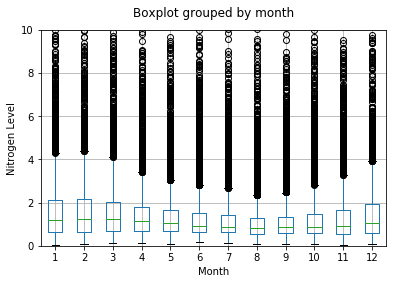

In [17]:
datadf_N = datadf.dropna(subset=['TOTAL NITROGEN'])

boxplot = datadf_N.boxplot(column=['TOTAL NITROGEN'], by=['month'])
boxplot.set_ylim([0, 10])
boxplot.set(xlabel='Month', ylabel='Nitrogen Level', title = '')

plt.savefig('month_boxplot.jpg')
plt.show()

Nitrogen goes down in summer months (outlies going beyond 10 are removed)

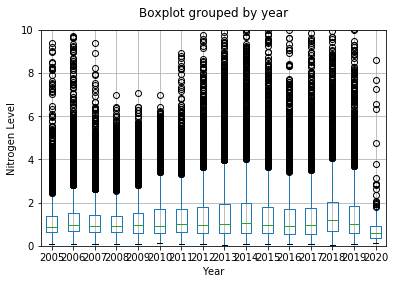

In [18]:
boxplot = datadf_N.boxplot(column=['TOTAL NITROGEN'], by=['year'])
boxplot.set_ylim([0, 10])
boxplot.set(xlabel='Year', ylabel='Nitrogen Level', title = '')

plt.savefig('year_boxplot.jpg')
plt.show()

Lower levels on nitrogen in 2020 are interesting. This year is incomplete, only includes early months, and is affected by covid.

### Maps displaying sampling information
Next, we'll make some maps

In [22]:
# make a geo data frame including the points of all the station locations
gdf=geopandas.GeoDataFrame(datadf,
                           geometry=geopandas.points_from_xy(
                             datadf.Longitude.astype(float),datadf.Latitude.astype(float)))

In [23]:
# import a map of US states
fid=urllib.request.urlretrieve("https://eric.clst.org/assets/wiki/uploads/Stuff/gz_2010_us_040_00_500k.json")
                               #"/tmp/gz_2010_us_040_00_500k.json") 
us_states = geopandas.read_file(fid[0])
us_states.head()

,GEO_ID,STATE,NAME,LSAD,CENSUSAREA,geometry
0,0400000US23,23,Maine,,30842.923,"MULTIPOLYGON (((-67.61976 44.51975, -67.61541 ..."
1,0400000US25,25,Massachusetts,,7800.058,"MULTIPOLYGON (((-70.83204 41.60650, -70.82373 ..."
2,0400000US26,26,Michigan,,56538.901,"MULTIPOLYGON (((-88.68443 48.11579, -88.67563 ..."
3,0400000US30,30,Montana,,145545.801,"POLYGON ((-104.05770 44.99743, -104.25015 44.9..."
4,0400000US32,32,Nevada,,109781.180,"POLYGON ((-114.05060 37.00040, -114.04999 36.9..."


   Latitude  Longitude  TOTAL NITROGEN
0  36.76987  -76.29605        0.889427
1  36.81340  -76.29030        0.757301
2  36.82917  -76.39583        0.770519
3  36.83611  -76.24444        0.723449
4  36.84070  -76.28911        0.660945


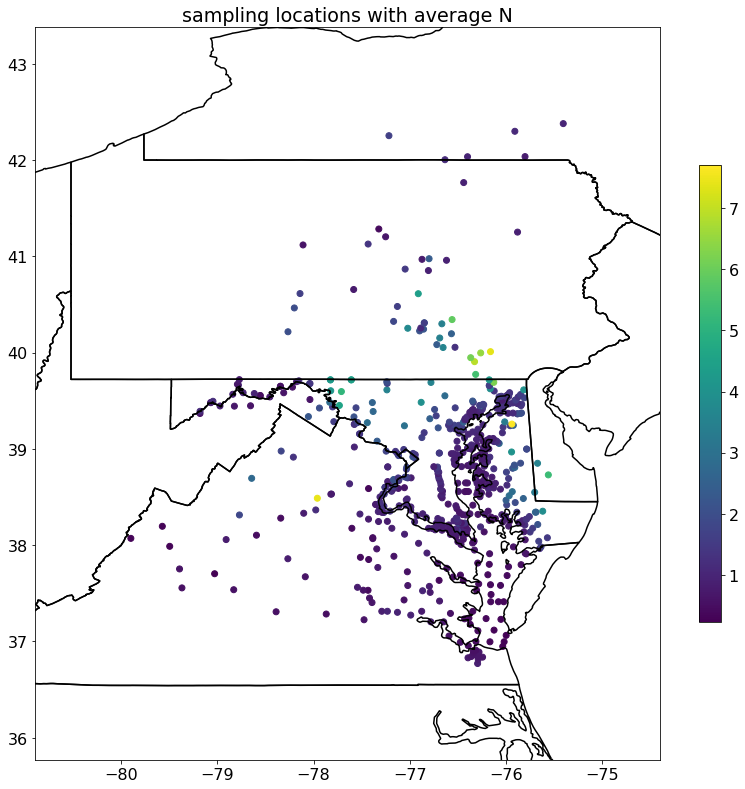

In [24]:
datadf_N_avg = datadf_N.groupby(['Latitude', 'Longitude'])['TOTAL NITROGEN'].mean()
datadf_N_avg = datadf_N_avg.to_frame()
datadf_N_avg = datadf_N_avg.reset_index(level=['Latitude', 'Longitude'])
#datadf_N_avg = datadf_N_avg.rename_axis(columns=['Latitude'])
print(datadf_N_avg.head())
gdf_avg = geopandas.GeoDataFrame(datadf_N_avg,
                           geometry=geopandas.points_from_xy(
                             datadf_N_avg.Longitude.astype(float),datadf_N_avg.Latitude.astype(float)))
gdf_avg.head()

# make a map of sampling locations

plt.rcParams.update({'font.size': 16})

ax = us_states.boundary.plot(color='black',figsize=[14,28])

gdf_avg.plot(ax=ax, column='TOTAL NITROGEN', legend=True, legend_kwds={'shrink': 0.3})


minx, miny, maxx, maxy = gdf_avg.total_bounds
ax.set_xlim(minx-1, maxx+1)
ax.set_ylim(miny-1, maxy+1)
ax.set_title('sampling locations with average N')

plt.savefig('aveN_sampLocations.jpg')
plt.show()

Higher Nitrogen levels can be found in southern Pennsylvania, and other upstream regions

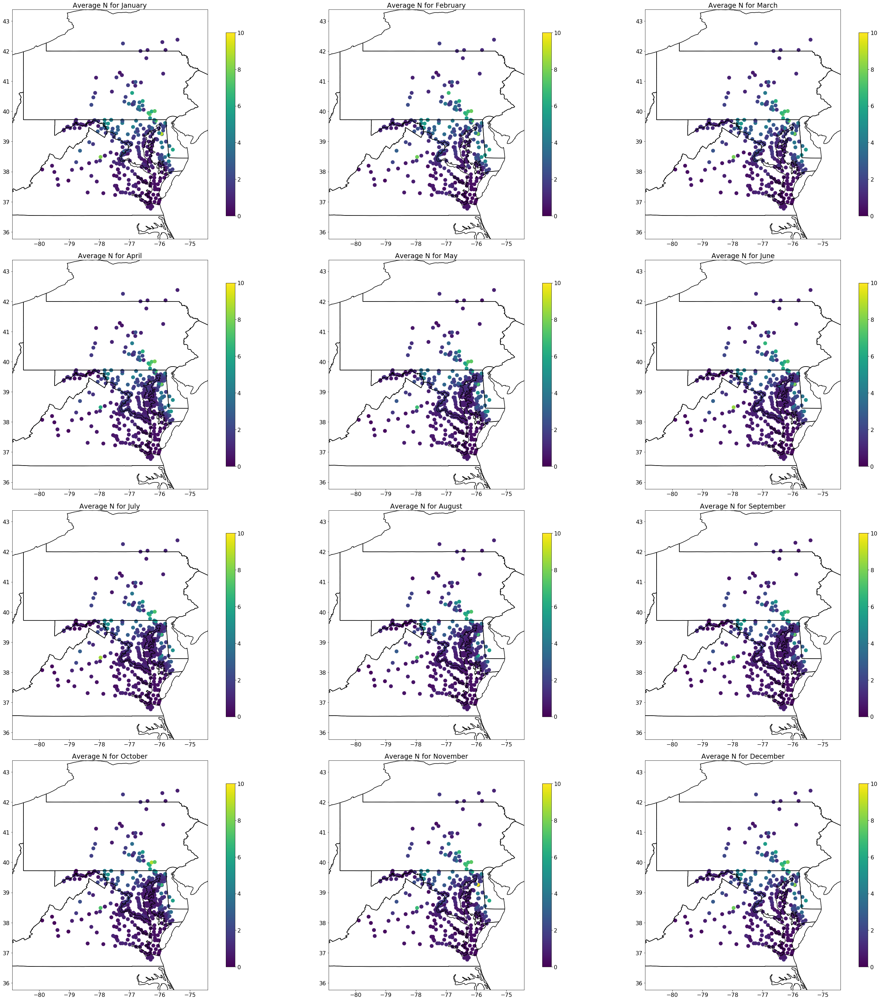

In [67]:
#Nitrogen values displayed over time and space
months = ['January', 'February', 'March', 'April', 'May', 'June',
         'July', 'August', 'September','October', 'November','December']
fig = plt.figure(figsize=(40, 40))
#fig, axes = plt.subplots(nrows=4, ncols=4)
for i in range(0,12):

    datadf_M = datadf_N[datadf_N['month'] == i+1]
    datadf_N_avg_M = datadf_M.groupby(['Latitude', 'Longitude'])['TOTAL NITROGEN'].mean()
    datadf_N_avg_M = datadf_N_avg_M.to_frame()
    datadf_N_avg_M = datadf_N_avg_M.reset_index(level=['Latitude', 'Longitude'])   
    gdf_avg = geopandas.GeoDataFrame(datadf_N_avg_M,
                           geometry=geopandas.points_from_xy(
                             datadf_N_avg_M.Longitude.astype(float),datadf_N_avg_M.Latitude.astype(float)))
    # make a map of sampling locations
    plt.rcParams.update({'font.size': 16})
    ax = fig.add_subplot(4,3,i+1)
    us_states.boundary.plot(ax = ax, color='black',figsize=[14,28])
    gdf_avg.plot(ax=ax, column='TOTAL NITROGEN', markersize = 100,
                 legend=True, legend_kwds={'shrink': 0.8},
                vmin = 0, vmax = 10)

    minx, miny, maxx, maxy = gdf_avg.total_bounds
    ax.set_xlim(minx-1, maxx+1)
    ax.set_ylim(miny-1, maxy+1)
    ax.set_title('Average N for '+months[i])

plt.tight_layout()
plt.savefig('aveN_sampLocations_months.jpg')
plt.show()



There don't seem to be any very large changes in average nitrogen levels for stations through the year.

   Latitude  Longitude  TOTAL NITROGEN
0  36.76987  -76.29605              88
1  36.81340  -76.29030              97
2  36.82917  -76.39583             134
3  36.83611  -76.24444             117
4  36.84070  -76.28911             102


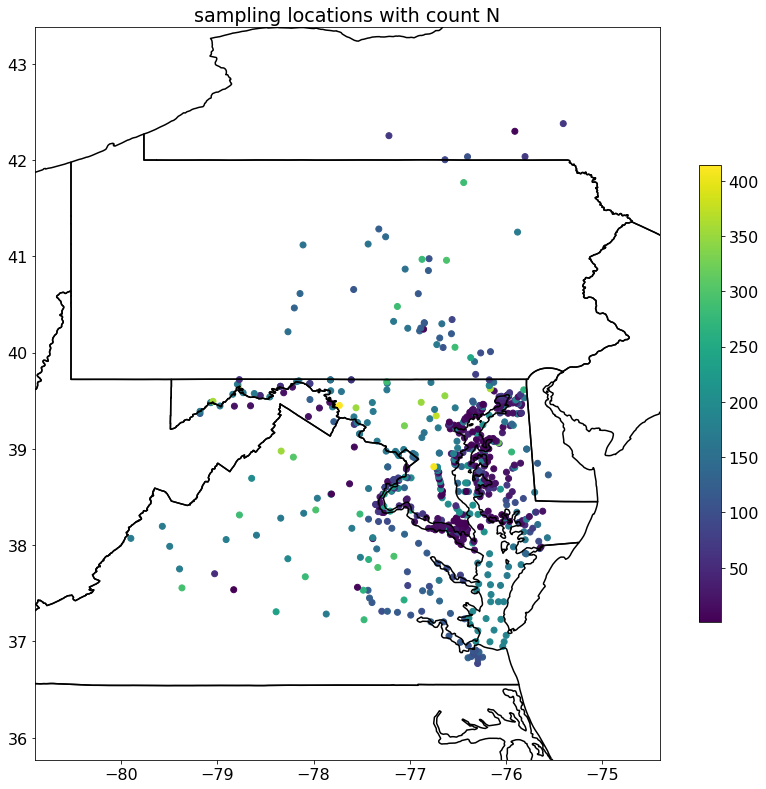

In [25]:
datadf_N_avg = datadf_N.groupby(['Latitude', 'Longitude'])['TOTAL NITROGEN'].count()
datadf_N_avg = datadf_N_avg.to_frame()
datadf_N_avg = datadf_N_avg.reset_index(level=['Latitude', 'Longitude'])
#datadf_N_avg = datadf_N_avg.rename_axis(columns=['Latitude'])
print(datadf_N_avg.head())
gdf_avg = geopandas.GeoDataFrame(datadf_N_avg,
                           geometry=geopandas.points_from_xy(
                             datadf_N_avg.Longitude.astype(float),datadf_N_avg.Latitude.astype(float)))
gdf_avg.head()

# make a map of sampling locations

plt.rcParams.update({'font.size': 16})

ax = us_states.boundary.plot(color='black',figsize=[14, 28])

gdf_avg.plot(ax=ax, column='TOTAL NITROGEN', legend=True, legend_kwds={'shrink': 0.3})


minx, miny, maxx, maxy = gdf_avg.total_bounds
ax.set_xlim(minx-1, maxx+1)
ax.set_ylim(miny-1, maxy+1)
ax.set_title('sampling locations with count N')

plt.savefig('countN_sampLocations.jpg')
plt.show()

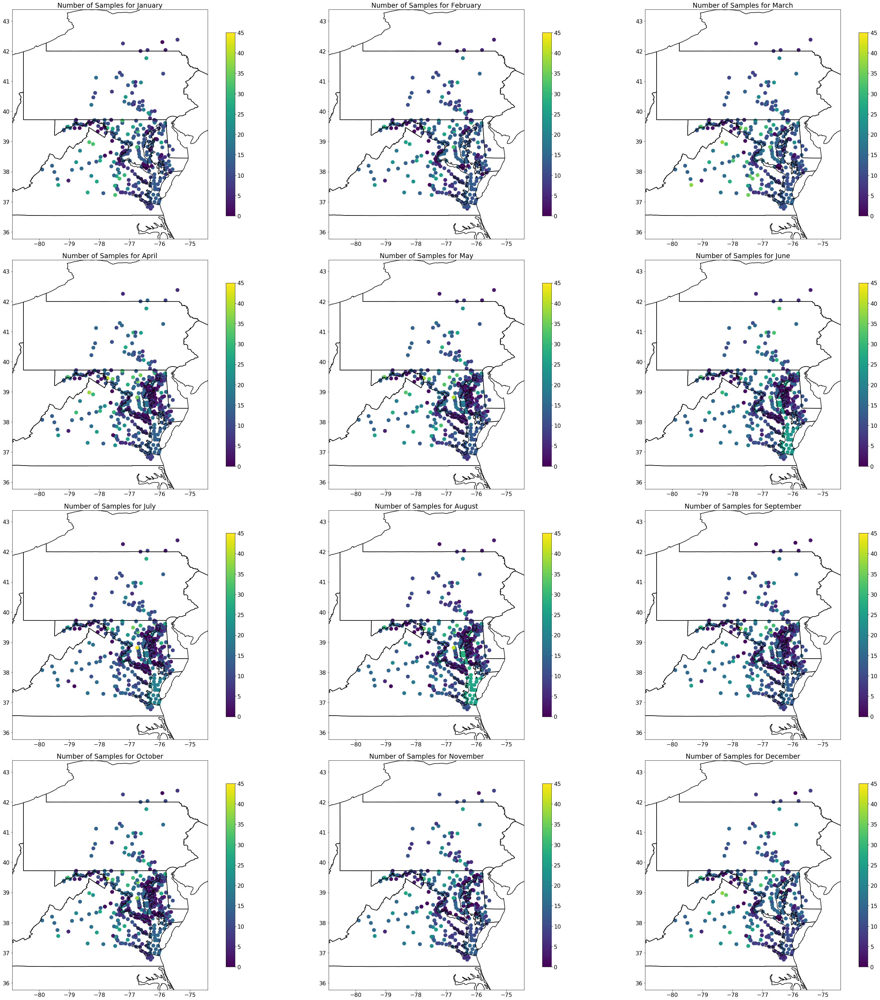

In [70]:
#Nitrogen values displayed over time and space
months = ['January', 'February', 'March', 'April', 'May', 'June',
         'July', 'August', 'September','October', 'November','December']
fig = plt.figure(figsize=(40, 40))
#fig, axes = plt.subplots(nrows=4, ncols=4)
for i in range(0,12):

    datadf_M = datadf_N[datadf_N['month'] == i+1]
    datadf_N_count_M = datadf_M.groupby(['Latitude', 'Longitude'])['TOTAL NITROGEN'].count()
    datadf_N_count_M = datadf_N_count_M.to_frame()
    datadf_N_count_M = datadf_N_count_M.reset_index(level=['Latitude', 'Longitude'])   
    gdf_count = geopandas.GeoDataFrame(datadf_N_count_M,
                           geometry=geopandas.points_from_xy(
                             datadf_N_count_M.Longitude.astype(float),datadf_N_count_M.Latitude.astype(float)))
    # make a map of sampling locations
    plt.rcParams.update({'font.size': 16})
    ax = fig.add_subplot(4,3,i+1)
    us_states.boundary.plot(ax = ax, color='black',figsize=[14,28])
    gdf_count.plot(ax=ax, column='TOTAL NITROGEN', markersize = 100,
                 legend=True, legend_kwds={'shrink': 0.8},
                vmin = 0, vmax=45)

    minx, miny, maxx, maxy = gdf_count.total_bounds
    ax.set_xlim(minx-1, maxx+1)
    ax.set_ylim(miny-1, maxy+1)
    ax.set_title('Number of Samples for '+months[i])

plt.tight_layout()
plt.savefig('countN_sampLocations_months.jpg')
plt.show()



In particular, the number of samples taken in the Chesapeake Bay itself increases in the sumer months.

There a few outliers with many more data samples but most seem to be less than 200.

   Latitude  Longitude  TOTAL NITROGEN
0  36.76987  -76.29605        0.139044
1  36.81340  -76.29030        0.206992
2  36.82917  -76.39583        0.082375
3  36.83611  -76.24444        0.102856
4  36.84070  -76.28911        0.058807


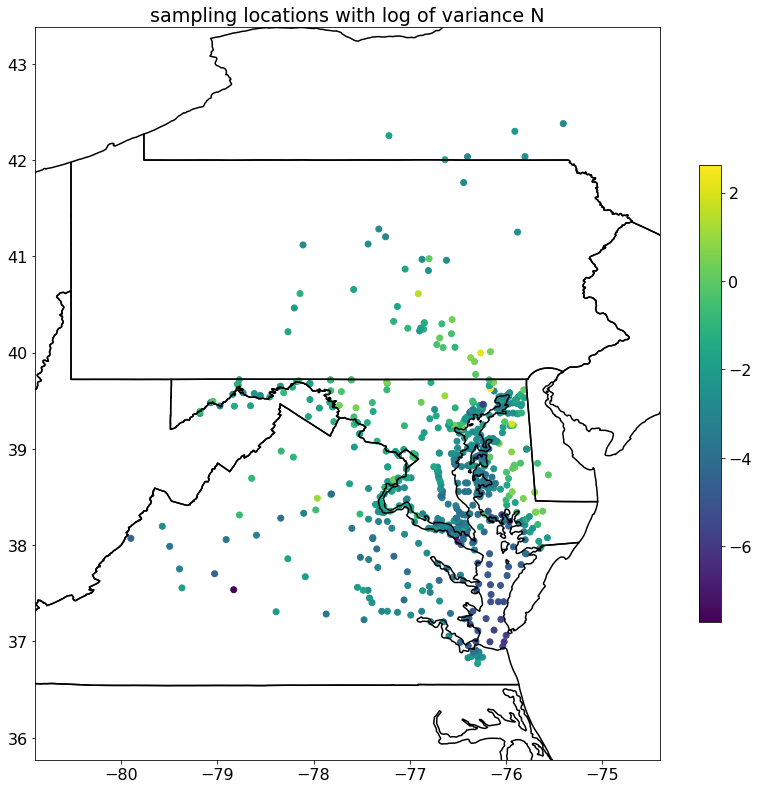

In [28]:
datadf_N_avg = datadf_N.groupby(['Latitude', 'Longitude'])['TOTAL NITROGEN'].var()
datadf_N_avg = datadf_N_avg.to_frame()
datadf_N_avg = datadf_N_avg.reset_index(level=['Latitude', 'Longitude'])
#datadf_N_avg = datadf_N_avg.rename_axis(columns=['Latitude'])
print(datadf_N_avg.head())
gdf_avg = geopandas.GeoDataFrame(datadf_N_avg,
                           geometry=geopandas.points_from_xy(
                             datadf_N_avg.Longitude.astype(float),datadf_N_avg.Latitude.astype(float)))
gdf_avg.head()


# make a map of sampling locations

plt.rcParams.update({'font.size': 16})

ax = us_states.boundary.plot(color='black',figsize=[14,28])

gdf_avg['log'] = np.log(gdf_avg['TOTAL NITROGEN'])

gdf_avg.plot(ax=ax, column='log', legend=True, legend_kwds={'shrink': 0.3})


minx, miny, maxx, maxy = gdf_avg.total_bounds
ax.set_xlim(minx-1, maxx+1)
ax.set_ylim(miny-1, maxy+1)
ax.set_title('sampling locations with log of variance N')

plt.savefig('logvarianceN_sampLocations.jpg')
plt.show()


There was one variance outlier so Log of variance is shown here.

### Maps of HUC cover percents

In [30]:
#get HUCS
HUCS_map = geopandas.read_file('C:/Users/Charlotte/Documents/HacktheBay/WBD_HUC_12-shp/WBD_HUC_12.shp')

#convert types of HUC12, HUC10, and HUC8 to number
HUCS_map["HUC12"] = HUCS_map["HUC12"].astype('int64')
HUCS_map["HUC10"] = HUCS_map["HUC10"].astype('int64')
HUCS_map["HUC8"] = HUCS_map["HUC8"].astype('int64')

HUCS_map

,OBJECTID,TNMID,MetaSource,SourceData,SourceOrig,SourceFeat,LoadDate,NonContrib,NonContr_1,AreaSqKm,...,HUC4_Name,HUC6_Name,HUC8_Name,HUC10_Name,Shape_Leng,Shape_Area,test_count,test_sum,test_mean,geometry
0,1,{9C83472B-0B5D-48B8-9382-B6AAD67E37F2},None,None,None,None,2013-01-18,0,0,54.02,...,Delaware-Mid Atlantic Coastal,Lower Delaware,Broadkill-Smyrna,Murderkill River-Frontal Delaware Bay,17634.854027,6.470518e+03,4.0,0.0,0.000000,"MULTIPOLYGON (((-75.59702 39.01442, -75.59771 ..."
1,2,{47BB3A4D-1C14-46A2-926B-78F9891CDC8F},None,None,None,None,2013-01-18,0,0,50.65,...,Delaware-Mid Atlantic Coastal,Lower Delaware,Broadkill-Smyrna,Murderkill River-Frontal Delaware Bay,21682.454687,7.072774e+03,6.0,0.0,0.000000,"MULTIPOLYGON (((-75.60494 38.95660, -75.60395 ..."
2,3,{B329BBA1-8D9E-4058-9A1E-EE12C60469D2},{ED602145-9201-4827-9CE1-05D252484579},None,None,None,2017-10-03,0,0,72.50,...,Delaware-Mid Atlantic Coastal,Lower Delaware,Broadkill-Smyrna,Murderkill River-Frontal Delaware Bay,8459.812609,3.007244e+03,3.0,0.0,0.000000,"MULTIPOLYGON (((-75.58441 39.05159, -75.58470 ..."
3,4,{225710C7-8CFC-4FD1-8018-E14302632E3D},{ED602145-9201-4827-9CE1-05D252484579},None,None,None,2017-10-03,0,0,70.03,...,Delaware-Mid Atlantic Coastal,Lower Delaware,Broadkill-Smyrna,Mispillion River-Frontal Delaware Bay,26760.941127,1.027238e+04,7.0,0.0,0.000000,"MULTIPOLYGON (((-75.55291 38.89441, -75.55302 ..."
4,5,{55B65281-E968-4677-AF85-DDBE3B49C742},{E9F5C988-2313-440E-A05E-C5871E2773A6},None,None,None,2013-01-18,0,0,45.23,...,Delaware-Mid Atlantic Coastal,Lower Delaware,Broadkill-Smyrna,Mispillion River-Frontal Delaware Bay,26936.348230,9.588997e+03,6.0,0.0,0.000000,"MULTIPOLYGON (((-75.47922 38.83228, -75.47951 ..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2074,2075,{6FF48162-430E-404C-8756-41D3B5E8C582},None,None,None,None,2013-01-18,0,0,44.46,...,Lower Chesapeake,James,Middle James-Buffalo,Wreck Island Creek-James River,38991.790028,7.077188e+07,49414.0,1816.0,0.036751,"POLYGON ((-78.89844 37.51142, -78.89876 37.510..."
2075,2076,{2E7E5F4C-9D68-4F3E-B750-C80FBFB2E155},None,None,None,None,2013-01-18,0,0,151.64,...,Lower Chesapeake,James,Middle James-Buffalo,Wreck Island Creek-James River,86962.668827,2.407948e+08,168462.0,230.0,0.001365,"POLYGON ((-78.88026 37.50996, -78.88082 37.508..."
2076,2077,{B56DFEE3-87BE-410B-883A-D64ADD31E577},None,None,None,None,2013-01-18,0,0,55.19,...,Lower Chesapeake,James,Middle James-Buffalo,Wreck Island Creek-James River,49123.756251,8.795113e+07,61335.0,1741.0,0.028385,"POLYGON ((-78.82895 37.53508, -78.82939 37.534..."
2077,2078,{BF404472-EF6B-4D26-905E-88EB6BE91146},None,None,None,None,2013-01-18,0,0,80.59,...,Lower Chesapeake,James,Middle James-Buffalo,Wreck Island Creek-James River,61973.342830,1.281559e+08,89533.0,61.0,0.000681,"POLYGON ((-78.81981 37.53137, -78.81897 37.531..."


In [34]:
#merge locations and HUC12
datadf_12 = pd.read_csv('HUC12_wPercents.csv')

gdf_temp = HUCS_map
geo_12 = pd.merge(gdf_temp, datadf_12, how = 'left', left_on = 'HUC12', right_on = 'HUC12')
geo_12.head()

,OBJECTID_x,TNMID,MetaSource,SourceData,SourceOrig,SourceFeat,LoadDate,NonContrib,NonContr_1,AreaSqKm,...,V_43_PERCENT,V_45_PERCENT,V_46_PERCENT,V_52_PERCENT,V_71_PERCENT,V_81_PERCENT,V_82_PERCENT,V_90_PERCENT,V_95_PERCENT,TotalPercents
0,1,{9C83472B-0B5D-48B8-9382-B6AAD67E37F2},None,None,None,None,2013-01-18,0,0,54.02,...,0.024197,0.000300,0.000017,0.002266,0.000100,0.003566,0.607629,0.189495,0.000450,1.0
1,2,{47BB3A4D-1C14-46A2-926B-78F9891CDC8F},None,None,None,None,2013-01-18,0,0,50.65,...,0.032948,0.000853,0.000036,0.002346,0.000160,0.001830,0.527937,0.132184,0.000427,1.0
2,3,{B329BBA1-8D9E-4058-9A1E-EE12C60469D2},{ED602145-9201-4827-9CE1-05D252484579},None,None,None,2017-10-03,0,0,72.50,...,0.014577,0.000000,0.000012,0.001453,0.000211,0.004644,0.541118,0.136571,0.005935,1.0
3,4,{225710C7-8CFC-4FD1-8018-E14302632E3D},{ED602145-9201-4827-9CE1-05D252484579},None,None,None,2017-10-03,0,0,70.03,...,0.085352,0.001722,0.000000,0.002210,0.000321,0.002557,0.544636,0.142780,0.002210,1.0
4,5,{55B65281-E968-4677-AF85-DDBE3B49C742},{E9F5C988-2313-440E-A05E-C5871E2773A6},None,None,None,2013-01-18,0,0,45.23,...,0.099475,0.002884,0.000239,0.005848,0.000855,0.001949,0.538927,0.120679,0.001253,1.0


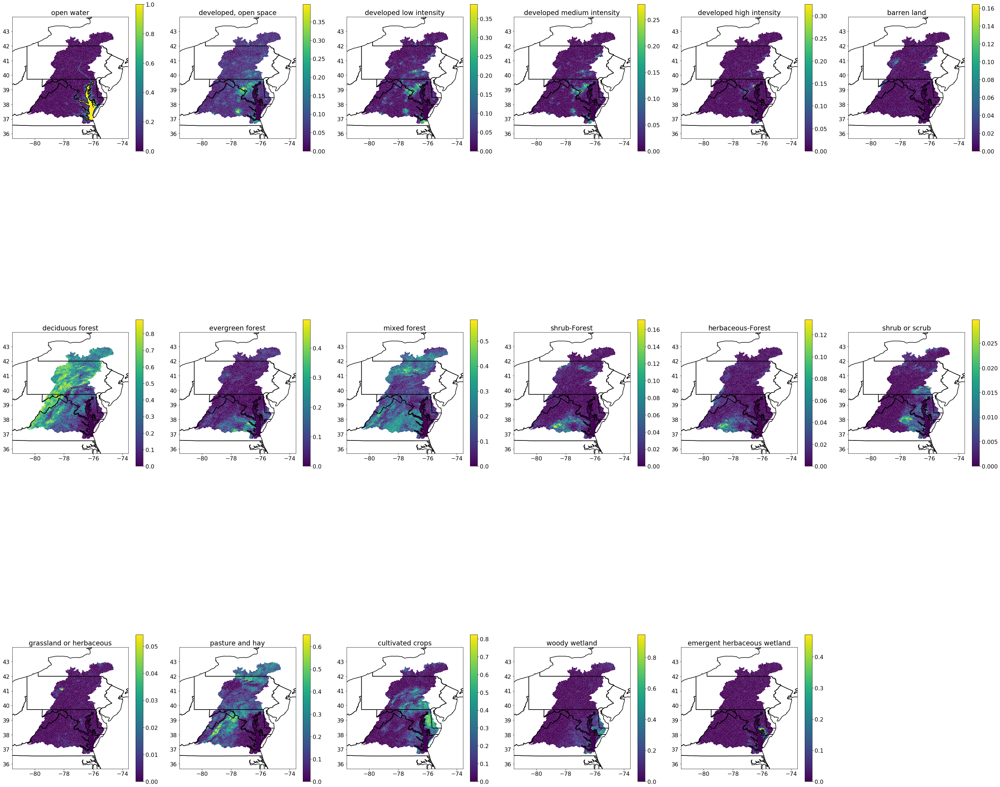

In [39]:
#show HUC12 percent covered by each land classifcation

fig = plt.figure(figsize=(40, 40))
#fig, axes = plt.subplots(nrows=4, ncols=4)

for i in range(0,len(HUC12_percent)):
    plt.rcParams.update({'font.size': 16})
    ax = fig.add_subplot(3,6,i+1)
    #fig.add_subplot(4, 4, i)
    us_states.boundary.plot(ax = ax, color='black')#,figsize=[14,28])

    geo_12.plot(ax=ax, column=HUC12_percent[i], legend=True, legend_kwds={'shrink': 0.4})
    

    minx, miny, maxx, maxy = geo_12.total_bounds
    ax.set_xlim(minx-1, maxx+1)
    ax.set_ylim(miny-1, maxy+1)
    ax.set_title(landcover_types[i])

    #plt.show()
    
    #ax.figure.savefig('HUC8'+landcover_types[i]+'.jpg')
    
plt.tight_layout()
plt.savefig('HUC12_coverMap.jpg')
plt.show()

In [40]:
#merge locations and HUC10
datadf_10 = pd.read_csv('HUC10_wPercents.csv')

gdf_temp = HUCS_map
geo_10 = pd.merge(gdf_temp, datadf_10, how = 'left', left_on = 'HUC10', right_on = 'HUC10')
geo_10.head()

,OBJECTID_x,TNMID,MetaSource,SourceData,SourceOrig,SourceFeat,LoadDate,NonContrib,NonContr_1,AreaSqKm,...,V_43_PERCENT,V_45_PERCENT,V_46_PERCENT,V_52_PERCENT,V_71_PERCENT,V_81_PERCENT,V_82_PERCENT,V_90_PERCENT,V_95_PERCENT,TotalPercents
0,1,{9C83472B-0B5D-48B8-9382-B6AAD67E37F2},None,None,None,None,2013-01-18,0,0,54.02,...,0.015509,0.000377,0.000014,0.001302,0.000175,0.002424,0.476405,0.134838,0.051454,1.0
1,2,{47BB3A4D-1C14-46A2-926B-78F9891CDC8F},None,None,None,None,2013-01-18,0,0,50.65,...,0.015509,0.000377,0.000014,0.001302,0.000175,0.002424,0.476405,0.134838,0.051454,1.0
2,3,{B329BBA1-8D9E-4058-9A1E-EE12C60469D2},{ED602145-9201-4827-9CE1-05D252484579},None,None,None,2017-10-03,0,0,72.50,...,0.015509,0.000377,0.000014,0.001302,0.000175,0.002424,0.476405,0.134838,0.051454,1.0
3,4,{225710C7-8CFC-4FD1-8018-E14302632E3D},{ED602145-9201-4827-9CE1-05D252484579},None,None,None,2017-10-03,0,0,70.03,...,0.035154,0.000844,0.000406,0.001477,0.000265,0.001342,0.360579,0.120019,0.090467,1.0
4,5,{55B65281-E968-4677-AF85-DDBE3B49C742},{E9F5C988-2313-440E-A05E-C5871E2773A6},None,None,None,2013-01-18,0,0,45.23,...,0.035154,0.000844,0.000406,0.001477,0.000265,0.001342,0.360579,0.120019,0.090467,1.0


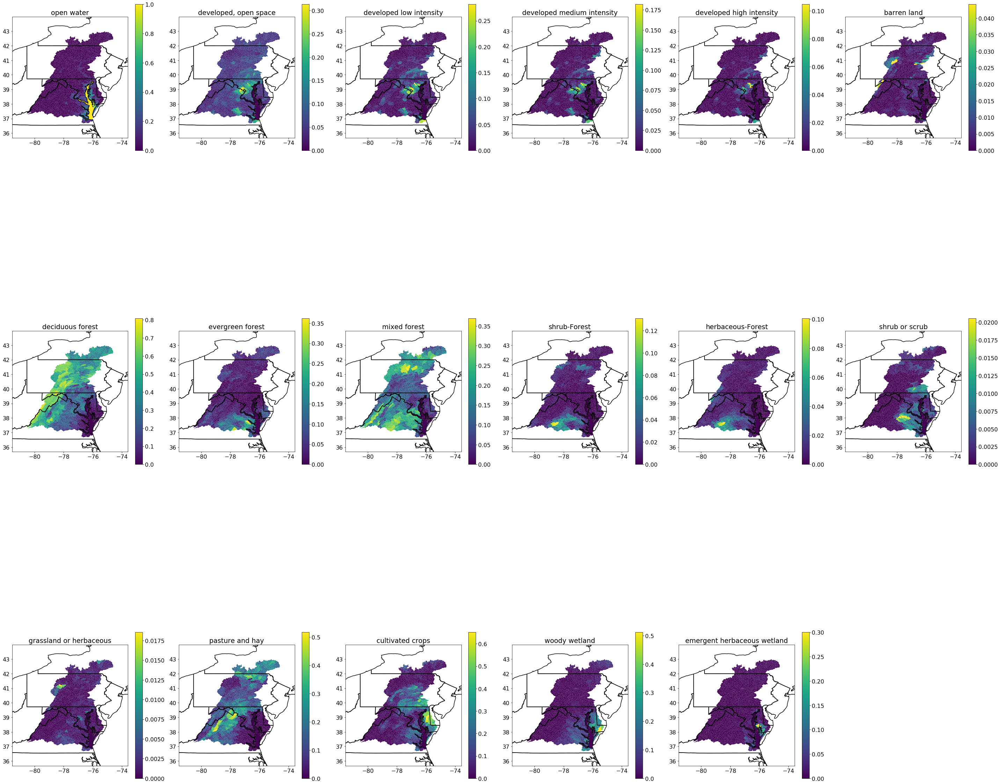

In [42]:
#show HUC10 percent covered by each land classifcation

fig = plt.figure(figsize=(40, 40))
#fig, axes = plt.subplots(nrows=4, ncols=4)

for i in range(0,len(HUC12_percent)):
    plt.rcParams.update({'font.size': 16})
    ax = fig.add_subplot(3,6,i+1)
    #fig.add_subplot(4, 4, i)
    us_states.boundary.plot(ax = ax, color='black')#,figsize=[14,28])

    geo_10.plot(ax=ax, column=HUC12_percent[i], legend=True, legend_kwds={'shrink': 0.4})
    

    minx, miny, maxx, maxy = geo_10.total_bounds
    ax.set_xlim(minx-1, maxx+1)
    ax.set_ylim(miny-1, maxy+1)
    ax.set_title(landcover_types[i])

    #plt.show()
    
    #ax.figure.savefig('HUC8'+landcover_types[i]+'.jpg')
    
plt.tight_layout()
plt.savefig('HUC10_coverMap.jpg')
plt.show()

In [44]:
#merge locations and HUC8
datadf_8 = pd.read_csv('HUC8_wPercents.csv')

gdf_temp = HUCS_map
geo_8 = pd.merge(gdf_temp, datadf_8, how = 'left', left_on = 'HUC8', right_on = 'HUC8')
geo_8.head()

,OBJECTID_x,TNMID,MetaSource,SourceData,SourceOrig,SourceFeat,LoadDate,NonContrib,NonContr_1,AreaSqKm,...,V_43_PERCENT,V_45_PERCENT,V_46_PERCENT,V_52_PERCENT,V_71_PERCENT,V_81_PERCENT,V_82_PERCENT,V_90_PERCENT,V_95_PERCENT,TotalPercents
0,1,{9C83472B-0B5D-48B8-9382-B6AAD67E37F2},None,None,None,None,2013-01-18,0,0,54.02,...,0.023629,0.001048,0.000224,0.001387,0.000336,0.00181,0.36637,0.118352,0.106827,1.0
1,2,{47BB3A4D-1C14-46A2-926B-78F9891CDC8F},None,None,None,None,2013-01-18,0,0,50.65,...,0.023629,0.001048,0.000224,0.001387,0.000336,0.00181,0.36637,0.118352,0.106827,1.0
2,3,{B329BBA1-8D9E-4058-9A1E-EE12C60469D2},{ED602145-9201-4827-9CE1-05D252484579},None,None,None,2017-10-03,0,0,72.50,...,0.023629,0.001048,0.000224,0.001387,0.000336,0.00181,0.36637,0.118352,0.106827,1.0
3,4,{225710C7-8CFC-4FD1-8018-E14302632E3D},{ED602145-9201-4827-9CE1-05D252484579},None,None,None,2017-10-03,0,0,70.03,...,0.023629,0.001048,0.000224,0.001387,0.000336,0.00181,0.36637,0.118352,0.106827,1.0
4,5,{55B65281-E968-4677-AF85-DDBE3B49C742},{E9F5C988-2313-440E-A05E-C5871E2773A6},None,None,None,2013-01-18,0,0,45.23,...,0.023629,0.001048,0.000224,0.001387,0.000336,0.00181,0.36637,0.118352,0.106827,1.0


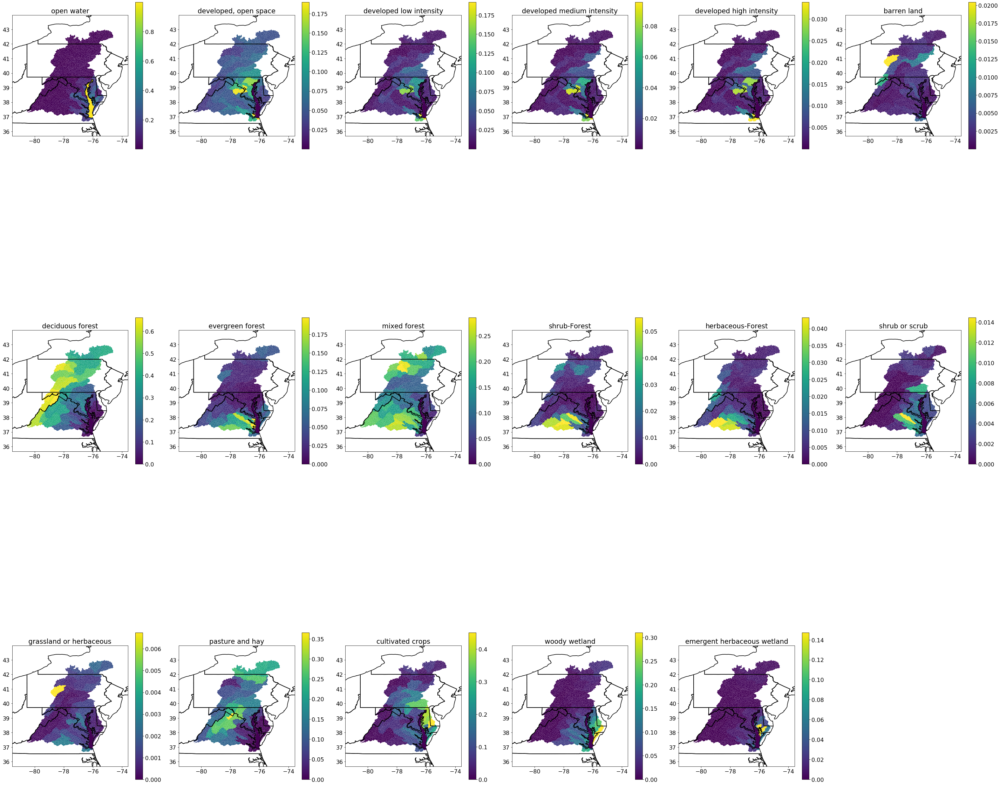

In [45]:
#show HUC8 percent covered by each land classifcation

fig = plt.figure(figsize=(40, 40))
#fig, axes = plt.subplots(nrows=4, ncols=4)

for i in range(0,len(HUC12_percent)):
    plt.rcParams.update({'font.size': 16})
    ax = fig.add_subplot(3,6,i+1)
    #fig.add_subplot(4, 4, i)
    us_states.boundary.plot(ax = ax, color='black')#,figsize=[14,28])

    geo_8.plot(ax=ax, column=HUC12_percent[i], legend=True, legend_kwds={'shrink': 0.4})
    

    minx, miny, maxx, maxy = geo_8.total_bounds
    ax.set_xlim(minx-1, maxx+1)
    ax.set_ylim(miny-1, maxy+1)
    ax.set_title(landcover_types[i])

    #plt.show()
    
    #ax.figure.savefig('HUC8'+landcover_types[i]+'.jpg')
    
plt.tight_layout()
plt.savefig('HUC8_coverMap.jpg')
plt.show()